In [93]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt
import matplotlib.colors
import math

In [94]:
xls = pd.ExcelFile('All_data_FIW_2013-2022.xlsx')
df = pd.read_excel(xls, 'FIW13-22')
df.columns = df.iloc[0]
bg = df.drop(df.index[0])

In [95]:
bg

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
1,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,1,4,1,1,2,1,5,23,40
2,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,0,1,0,1,2,9,10
3,Albania,Europe,c,2022,PF,3,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
4,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,2,6,2,2,2,1,7,22,32
5,Andorra,Europe,c,2022,F,1,1,4,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091,West Bank,Middle East,t,2013,NF,6,5,0,0,2,...,0,1,5,1,1,2,1,5,24,30
2092,Western Sahara,Africa,t,2013,NF,7,7,0,0,0,...,0,0,0,1,1,2,0,4,7,5
2093,Yemen,Middle East,c,2013,NF,6,6,1,0,2,...,0,1,2,2,1,1,1,5,16,25
2094,Zambia,Africa,c,2013,PF,3,4,3,3,3,...,2,2,8,3,2,1,2,8,34,62


In [10]:
one = bg.loc[bg.Edition == 2019]
two = bg.loc[bg.Edition == 2022]

In [39]:
three = pd.DataFrame({"Country": one["Country/Territory"], "Total_19": one["Total"]})
four = pd.DataFrame({"Country": two["Country/Territory"], "Total_22": two["Total"]})
five = four.join(three.set_index('Country'), on='Country')
six = five.replace(np.nan,0)
six["Change"] = six["Total_22"] - six["Total_19"]
six

,Country,Total_22,Total_19,Change
1,Abkhazia,40,41,-1
2,Afghanistan,10,27,-17
3,Albania,67,68,-1
4,Algeria,32,34,-2
5,Andorra,93,94,-1
...,...,...,...,...
206,West Bank,23,25,-2
207,Western Sahara,4,4,0
208,Yemen,9,11,-2
209,Zambia,51,54,-3


In [6]:
six.loc[six["Country"] == "Eastern Donbas"]

,Country,Total_22,Total_19,Change
53,Eastern Donbas,4,0,4


In [7]:
love = []

for i in two["Country/Territory"]:
    love.append(i)

for j in one["Country/Territory"]:
    love.append(j)

for i in love:
    print(i, love.count(i))

Abkhazia 2
Afghanistan 2
Albania 2
Algeria 2
Andorra 2
Angola 2
Antigua and Barbuda 2
Argentina 2
Armenia 2
Australia 2
Austria 2
Azerbaijan 2
Bahamas 2
Bahrain 2
Bangladesh 2
Barbados 2
Belarus 2
Belgium 2
Belize 2
Benin 2
Bhutan 2
Bolivia 2
Bosnia and Herzegovina 2
Botswana 2
Brazil 2
Brunei 2
Bulgaria 2
Burkina Faso 2
Burundi 2
Cabo Verde 2
Cambodia 2
Cameroon 2
Canada 2
Central African Republic 2
Chad 2
Chile 2
China 2
Colombia 2
Comoros 2
Congo (Brazzaville) 2
Congo (Kinshasa) 2
Costa Rica 2
Cote d'Ivoire 2
Crimea 2
Croatia 2
Cuba 2
Cyprus 2
Czech Republic 2
Denmark 2
Djibouti 2
Dominica 2
Dominican Republic 2
Eastern Donbas 1
Ecuador 2
Egypt 2
El Salvador 2
Equatorial Guinea 2
Eritrea 2
Estonia 2
Eswatini 2
Ethiopia 2
Fiji 2
Finland 2
France 2
Gabon 2
Gaza Strip 2
Georgia 2
Germany 2
Ghana 2
Greece 2
Grenada 2
Guatemala 2
Guinea 2
Guinea-Bissau 2
Guyana 2
Haiti 2
Honduras 2
Hong Kong 2
Hungary 2
Iceland 2
India 2
Indian Kashmir 2
Indonesia 2
Iran 2
Iraq 2
Ireland 2
Israel 2
Italy

In [8]:
cog = [one,two,three,four]
liz = [" "]
for i in range(1,4):
    zag = (cog[i]-cog[i-1])/cog[i-1]*100
    liz.append("%.2f" % zag)

TypeError: must be real number, not DataFrame

In [37]:
data = {"Year": [2019, 2020, 2021, 2022], "Total score": cog, "Percent hange in score": liz}

In [38]:
pd.DataFrame(data)

,Year,Total score,Percent hange in score
0,2019,11981,
1,2020,11907,-0.62
2,2021,11808,-0.83
3,2022,11699,-0.92


In [96]:
year = bg.loc[bg.Edition == 2022].reset_index()
year

,index,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
0,1,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,...,1,1,4,1,1,2,1,5,23,40
1,2,Afghanistan,Asia,c,2022,NF,7,6,0,0,...,0,0,0,0,1,0,1,2,9,10
2,3,Albania,Europe,c,2022,PF,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
3,4,Algeria,Africa,c,2022,NF,6,5,1,1,...,2,2,6,2,2,2,1,7,22,32
4,5,Andorra,Europe,c,2022,F,1,1,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,206,West Bank,Middle East,t,2022,NF,7,5,0,0,...,0,1,4,1,1,2,1,5,19,23
206,207,Western Sahara,Africa,t,2022,NF,7,7,0,0,...,0,0,0,1,1,2,0,4,7,4
207,208,Yemen,Middle East,c,2022,NF,7,6,0,0,...,0,0,1,0,1,1,0,2,8,9
208,209,Zambia,Africa,c,2022,PF,4,4,2,2,...,2,2,8,3,2,2,1,8,30,51


In [97]:
listle = bg.loc[bg.Edition == 2019].Total.reset_index()["Total"]
listle

0      41
1      27
2      68
3      34
4      94
       ..
204    25
205     4
206    11
207    54
208    31
Name: Total, Length: 209, dtype: object

In [98]:
dag = year.loc[year["Country/Territory"] != "Eastern Donbas"].reset_index().drop(columns=['level_0', 'index'])
dag

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
0,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,1,4,1,1,2,1,5,23,40
1,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,0,1,0,1,2,9,10
2,Albania,Europe,c,2022,PF,3,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
3,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,2,6,2,2,2,1,7,22,32
4,Andorra,Europe,c,2022,F,1,1,4,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,West Bank,Middle East,t,2022,NF,7,5,0,0,1,...,0,1,4,1,1,2,1,5,19,23
205,Western Sahara,Africa,t,2022,NF,7,7,0,0,0,...,0,0,0,1,1,2,0,4,7,4
206,Yemen,Middle East,c,2022,NF,7,6,0,0,0,...,0,0,1,0,1,1,0,2,8,9
207,Zambia,Africa,c,2022,PF,4,4,2,2,2,...,2,2,8,3,2,2,1,8,30,51


/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_6789/1247449912.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dag["Total (2020)"] = listle


In [99]:
dag["Total (2019)"] = listle
dag

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F4,F,G1,G2,G3,G4,G,CL,Total,Total (2019)
0,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,4,1,1,2,1,5,23,40,41
1,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,1,0,1,2,9,10,27
2,Albania,Europe,c,2022,PF,3,3,3,3,3,...,3,9,3,2,2,2,9,39,67,68
3,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,6,2,2,2,1,7,22,32,34
4,Andorra,Europe,c,2022,F,1,1,4,4,4,...,3,15,4,4,3,4,15,55,93,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,West Bank,Middle East,t,2022,NF,7,5,0,0,1,...,1,4,1,1,2,1,5,19,23,25
205,Western Sahara,Africa,t,2022,NF,7,7,0,0,0,...,0,0,1,1,2,0,4,7,4,4
206,Yemen,Middle East,c,2022,NF,7,6,0,0,0,...,0,1,0,1,1,0,2,8,9,11
207,Zambia,Africa,c,2022,PF,4,4,2,2,2,...,2,8,3,2,2,1,8,30,51,54


In [100]:
trial = dag.loc[dag["Total (2019)"] !=0 ]
trial

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F4,F,G1,G2,G3,G4,G,CL,Total,Total (2019)
0,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,4,1,1,2,1,5,23,40,41
1,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,1,0,1,2,9,10,27
2,Albania,Europe,c,2022,PF,3,3,3,3,3,...,3,9,3,2,2,2,9,39,67,68
3,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,6,2,2,2,1,7,22,32,34
4,Andorra,Europe,c,2022,F,1,1,4,4,4,...,3,15,4,4,3,4,15,55,93,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,West Bank,Middle East,t,2022,NF,7,5,0,0,1,...,1,4,1,1,2,1,5,19,23,25
205,Western Sahara,Africa,t,2022,NF,7,7,0,0,0,...,0,0,1,1,2,0,4,7,4,4
206,Yemen,Middle East,c,2022,NF,7,6,0,0,0,...,0,1,0,1,1,0,2,8,9,11
207,Zambia,Africa,c,2022,PF,4,4,2,2,2,...,2,8,3,2,2,1,8,30,51,54


In [101]:
pog = (trial.Total-trial["Total (2019)"])/trial["Total (2019)"]*100
trial["Percent Change"] = pog

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_17090/1573545252.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [102]:
trial

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F,G1,G2,G3,G4,G,CL,Total,Total (2019),Percent Change
0,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,4,1,1,2,1,5,23,40,41,-2.439024
1,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,1,0,1,2,9,10,27,-62.962963
2,Albania,Europe,c,2022,PF,3,3,3,3,3,...,9,3,2,2,2,9,39,67,68,-1.470588
3,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,6,2,2,2,1,7,22,32,34,-5.882353
4,Andorra,Europe,c,2022,F,1,1,4,4,4,...,15,4,4,3,4,15,55,93,94,-1.06383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,West Bank,Middle East,t,2022,NF,7,5,0,0,1,...,4,1,1,2,1,5,19,23,25,-8.0
205,Western Sahara,Africa,t,2022,NF,7,7,0,0,0,...,0,1,1,2,0,4,7,4,4,0.0
206,Yemen,Middle East,c,2022,NF,7,6,0,0,0,...,1,0,1,1,0,2,8,9,11,-18.181818
207,Zambia,Africa,c,2022,PF,4,4,2,2,2,...,8,3,2,2,1,8,30,51,54,-5.555556


In [103]:
trial["val"] = trial["Percent Change"].astype(float)

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_17090/3711083661.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [104]:
import plotly.express as px
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

In [105]:
title = "Percent change in Civil Liberty Score from 2020 to 2022"
fig = px.choropleth(trial, locations='Country/Territory',locationmode='country names', color='val',scope="world",labels={'val':'Percent change in CL score (%)'}
                   ,color_continuous_scale=[
                        [0, 'rgb(239,0,0)'],[0.3, 'rgb(255,140,7)'],[0.6, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']])
fig.update_layout(
            title={
            'text' : title,
            'x':0.5,
            'xanchor': 'center'
        },coloraxis_colorbar_orientation='h',coloraxis_colorbar_y=-0.2)

fig.show()

In [162]:
title = "Percent change in Civil Liberty Score from 2020 to 2022"
fig = px.choropleth(trial, locations='Country/Territory',locationmode='country names', color='val',scope="europe",labels={'val':'% change in CL score'}
                   ,color_continuous_scale=[
                        [0, 'rgb(239,0,0)'],[0.3, 'rgb(255,140,7)'],[0.6, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']])
fig.update_layout(
            title={
            'text' : title,
            'x':0.5,
            'xanchor': 'center'
        },coloraxis_colorbar_orientation='v',coloraxis_colorbar_x=0.85)
fig.show()

In [163]:
import geopandas as geos
fig.update_geos(
    center=dict(lon=15.2, lat=54),
    projection_rotation=dict(lon=15.2, lat=54, roll=0),
    lataxis_range=[36,72], lonaxis_range=[-10, 66]
)
fig.update_layout(height=500, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [35]:
gdf

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,G1,G2,G3,G4,G,CL,Total,Total (2019),Percent Change,val
0,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,1,2,1,5,23,40,41,-2.439024,-2.439024
1,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,1,0,1,2,9,10,27,-62.962963,-62.962963
2,Albania,Europe,c,2022,PF,3,3,3,3,3,...,3,2,2,2,9,39,67,68,-1.470588,-1.470588
3,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,2,2,1,7,22,32,34,-5.882353,-5.882353
4,Andorra,Europe,c,2022,F,1,1,4,4,4,...,4,4,3,4,15,55,93,94,-1.06383,-1.063830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,West Bank,Middle East,t,2022,NF,7,5,0,0,1,...,1,1,2,1,5,19,23,25,-8.0,-8.000000
205,Western Sahara,Africa,t,2022,NF,7,7,0,0,0,...,1,1,2,0,4,7,4,4,0.0,0.000000
206,Yemen,Middle East,c,2022,NF,7,6,0,0,0,...,0,1,1,0,2,8,9,11,-18.181818,-18.181818
207,Zambia,Africa,c,2022,PF,4,4,2,2,2,...,3,2,2,1,8,30,51,54,-5.555556,-5.555556


In [37]:
gdf.plot

In [70]:
trial["Percent Change"][0].type()

AttributeError: 'float' object has no attribute 'type'

In [81]:
zaggle = bg.loc[bg.Edition == 2022].reset_index()
zaggle

,index,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
0,1,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,...,1,1,4,1,1,2,1,5,23,40
1,2,Afghanistan,Asia,c,2022,NF,7,6,0,0,...,0,0,0,0,1,0,1,2,9,10
2,3,Albania,Europe,c,2022,PF,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
3,4,Algeria,Africa,c,2022,NF,6,5,1,1,...,2,2,6,2,2,2,1,7,22,32
4,5,Andorra,Europe,c,2022,F,1,1,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,206,West Bank,Middle East,t,2022,NF,7,5,0,0,...,0,1,4,1,1,2,1,5,19,23
206,207,Western Sahara,Africa,t,2022,NF,7,7,0,0,...,0,0,0,1,1,2,0,4,7,4
207,208,Yemen,Middle East,c,2022,NF,7,6,0,0,...,0,0,1,0,1,1,0,2,8,9
208,209,Zambia,Africa,c,2022,PF,4,4,2,2,...,2,2,8,3,2,2,1,8,30,51


In [90]:
fig = px.choropleth(zaggle, locations='Country/Territory',locationmode='country names', color='Total',scope="world")
fig.update_layout(
            title={
            'text' : title,
            'x':0.5,
            'xanchor': 'center'
        })
fig.show()

In [84]:
for i in zaggle["Total"]:
    print(type(i))

<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class

In [3]:
meta = pd.read_csv("ACSSPP1Y2021.S0201-Column-Metadata.csv")
meta

,Column Name,Label
0,GEO_ID,Geography
1,NAME,Geographic Area Name
2,POPGROUP,Race/Ethnic Group
3,POPGROUP_LABEL,Population Groups
4,S0201_001E,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Tota...
...,...,...
1231,S0201_307MA,Annotation of Margin of Error!!COMPUTERS AND I...
1232,S0201_308E,Estimate!!COMPUTERS AND INTERNET USE!!Total ho...
1233,S0201_308M,Margin of Error!!COMPUTERS AND INTERNET USE!!T...
1234,S0201_308MA,Annotation of Margin of Error!!COMPUTERS AND I...


In [4]:
Penn = pd.read_csv("ACSSPP1Y2021.S0201-Data.csv")
Penn

,GEO_ID,NAME,POPGROUP,POPGROUP_LABEL,S0201_001E,S0201_001M,S0201_001MA,S0201_001EA,S0201_002E,S0201_002M,...,S0201_306MA,S0201_306EA,S0201_307E,S0201_307EA,S0201_307M,S0201_307MA,S0201_308E,S0201_308M,S0201_308MA,S0201_308EA
0,0500000US01073,"Jefferson County, Alabama",1,Total population,667820,*****,*****,NaN,96.3,0.6,...,NaN,NaN,95.3,NaN,0.7,NaN,89.0,0.9,NaN,NaN
1,0500000US04013,"Maricopa County, Arizona",1,Total population,4496588,*****,*****,NaN,79.8,0.5,...,NaN,NaN,97.1,NaN,0.2,NaN,93.1,0.4,NaN,NaN
2,0500000US04019,"Pima County, Arizona",1,Total population,1052030,*****,*****,NaN,79.3,1.0,...,NaN,NaN,95.7,NaN,0.5,NaN,91.3,0.7,NaN,NaN
3,0500000US06001,"Alameda County, California",1,Total population,1648556,*****,*****,NaN,88.4,0.7,...,NaN,NaN,96.7,NaN,0.4,NaN,93.0,0.6,NaN,NaN
4,0500000US06013,"Contra Costa County, California",1,Total population,1161413,*****,*****,NaN,85.0,0.9,...,NaN,NaN,97.3,NaN,0.4,NaN,95.0,0.6,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0500000US53053,"Pierce County, Washington",1,Total population,925708,*****,*****,NaN,84.8,0.9,...,NaN,NaN,97.2,NaN,0.5,NaN,94.3,0.8,NaN,NaN
140,0500000US53061,"Snohomish County, Washington",1,Total population,833540,*****,*****,NaN,87.8,0.9,...,NaN,NaN,97.5,NaN,0.5,NaN,94.9,0.7,NaN,NaN
141,0500000US53063,"Spokane County, Washington",1,Total population,546040,*****,*****,NaN,90.6,1.0,...,NaN,NaN,96.2,NaN,0.7,NaN,91.3,1.1,NaN,NaN
142,0500000US55025,"Dane County, Wisconsin",1,Total population,563951,*****,*****,NaN,91.3,1.0,...,NaN,NaN,97.6,NaN,0.5,NaN,93.3,0.9,NaN,NaN


In [5]:
for i in range(Penn.shape[1]):
    Penn.rename(index={i: meta.Label[i]})

In [6]:
state = Penn.rename(columns=meta.set_index('Column Name')['Label'])

In [7]:
state

,Geography,Geographic Area Name,Race/Ethnic Group,Population Groups,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population,Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population,Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population,Annotation of Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race,Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race,...,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households,Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription
0,0500000US01073,"Jefferson County, Alabama",1,Total population,667820,*****,*****,NaN,96.3,0.6,...,NaN,NaN,95.3,NaN,0.7,NaN,89.0,0.9,NaN,NaN
1,0500000US04013,"Maricopa County, Arizona",1,Total population,4496588,*****,*****,NaN,79.8,0.5,...,NaN,NaN,97.1,NaN,0.2,NaN,93.1,0.4,NaN,NaN
2,0500000US04019,"Pima County, Arizona",1,Total population,1052030,*****,*****,NaN,79.3,1.0,...,NaN,NaN,95.7,NaN,0.5,NaN,91.3,0.7,NaN,NaN
3,0500000US06001,"Alameda County, California",1,Total population,1648556,*****,*****,NaN,88.4,0.7,...,NaN,NaN,96.7,NaN,0.4,NaN,93.0,0.6,NaN,NaN
4,0500000US06013,"Contra Costa County, California",1,Total population,1161413,*****,*****,NaN,85.0,0.9,...,NaN,NaN,97.3,NaN,0.4,NaN,95.0,0.6,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0500000US53053,"Pierce County, Washington",1,Total population,925708,*****,*****,NaN,84.8,0.9,...,NaN,NaN,97.2,NaN,0.5,NaN,94.3,0.8,NaN,NaN
140,0500000US53061,"Snohomish County, Washington",1,Total population,833540,*****,*****,NaN,87.8,0.9,...,NaN,NaN,97.5,NaN,0.5,NaN,94.9,0.7,NaN,NaN
141,0500000US53063,"Spokane County, Washington",1,Total population,546040,*****,*****,NaN,90.6,1.0,...,NaN,NaN,96.2,NaN,0.7,NaN,91.3,1.1,NaN,NaN
142,0500000US55025,"Dane County, Wisconsin",1,Total population,563951,*****,*****,NaN,91.3,1.0,...,NaN,NaN,97.6,NaN,0.5,NaN,93.3,0.9,NaN,NaN


In [8]:
state["Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population"].sum()

166215160

In [9]:
etat = []
for i in state["Geographic Area Name"]:
    etat.append(i.split(",")[1])
etat

[' Alabama',
 ' Arizona',
 ' Arizona',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' California',
 ' Colorado',
 ' Colorado',
 ' Colorado',
 ' Colorado',
 ' Colorado',
 ' Connecticut',
 ' Connecticut',
 ' Connecticut',
 ' Delaware',
 ' District of Columbia',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Florida',
 ' Georgia',
 ' Georgia',
 ' Georgia',
 ' Georgia',
 ' Hawaii',
 ' Idaho',
 ' Illinois',
 ' Illinois',
 ' Illinois',
 ' Illinois',
 ' Illinois',
 ' Indiana',
 ' Kansas',
 ' Kansas',
 ' Kentucky',
 ' Maryland',
 ' Maryland',
 ' Maryland',
 ' Maryland',
 ' Maryland',
 ' Massachusetts',
 ' Massachusetts',
 ' Massachusetts',
 ' Massachusetts',
 ' Massachusetts',
 ' Massachu

In [27]:
state[['County', 'State']] = state['Geographic Area Name'].str.split(',', 1, expand=True)
state

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_8774/2442174885.py:1: FutureWarning:

In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.



,Geography,Geographic Area Name,Race/Ethnic Group,Population Groups,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population,Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population,Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population,Annotation of Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race,Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race,...,Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,County,State
0,0500000US01073,"Jefferson County, Alabama",1,Total population,667820,*****,*****,NaN,96.3,0.6,...,95.3,NaN,0.7,NaN,89.0,0.9,NaN,NaN,Jefferson County,Alabama
1,0500000US04013,"Maricopa County, Arizona",1,Total population,4496588,*****,*****,NaN,79.8,0.5,...,97.1,NaN,0.2,NaN,93.1,0.4,NaN,NaN,Maricopa County,Arizona
2,0500000US04019,"Pima County, Arizona",1,Total population,1052030,*****,*****,NaN,79.3,1.0,...,95.7,NaN,0.5,NaN,91.3,0.7,NaN,NaN,Pima County,Arizona
3,0500000US06001,"Alameda County, California",1,Total population,1648556,*****,*****,NaN,88.4,0.7,...,96.7,NaN,0.4,NaN,93.0,0.6,NaN,NaN,Alameda County,California
4,0500000US06013,"Contra Costa County, California",1,Total population,1161413,*****,*****,NaN,85.0,0.9,...,97.3,NaN,0.4,NaN,95.0,0.6,NaN,NaN,Contra Costa County,California
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0500000US53053,"Pierce County, Washington",1,Total population,925708,*****,*****,NaN,84.8,0.9,...,97.2,NaN,0.5,NaN,94.3,0.8,NaN,NaN,Pierce County,Washington
140,0500000US53061,"Snohomish County, Washington",1,Total population,833540,*****,*****,NaN,87.8,0.9,...,97.5,NaN,0.5,NaN,94.9,0.7,NaN,NaN,Snohomish County,Washington
141,0500000US53063,"Spokane County, Washington",1,Total population,546040,*****,*****,NaN,90.6,1.0,...,96.2,NaN,0.7,NaN,91.3,1.1,NaN,NaN,Spokane County,Washington
142,0500000US55025,"Dane County, Wisconsin",1,Total population,563951,*****,*****,NaN,91.3,1.0,...,97.6,NaN,0.5,NaN,93.3,0.9,NaN,NaN,Dane County,Wisconsin


In [108]:
Penn[['County', 'State']] = Penn['NAME'].str.split(',', 1, expand=True)
Penn

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_2264/2717637416.py:1: FutureWarning:

In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.



,GEO_ID,NAME,POPGROUP,POPGROUP_LABEL,S0201_001E,S0201_001M,S0201_001MA,S0201_001EA,S0201_002E,S0201_002M,...,S0201_307E,S0201_307EA,S0201_307M,S0201_307MA,S0201_308E,S0201_308M,S0201_308MA,S0201_308EA,County,State
0,0500000US01073,"Jefferson County, Alabama",1,Total population,667820,*****,*****,NaN,96.3,0.6,...,95.3,NaN,0.7,NaN,89.0,0.9,NaN,NaN,Jefferson County,Alabama
1,0500000US04013,"Maricopa County, Arizona",1,Total population,4496588,*****,*****,NaN,79.8,0.5,...,97.1,NaN,0.2,NaN,93.1,0.4,NaN,NaN,Maricopa County,Arizona
2,0500000US04019,"Pima County, Arizona",1,Total population,1052030,*****,*****,NaN,79.3,1.0,...,95.7,NaN,0.5,NaN,91.3,0.7,NaN,NaN,Pima County,Arizona
3,0500000US06001,"Alameda County, California",1,Total population,1648556,*****,*****,NaN,88.4,0.7,...,96.7,NaN,0.4,NaN,93.0,0.6,NaN,NaN,Alameda County,California
4,0500000US06013,"Contra Costa County, California",1,Total population,1161413,*****,*****,NaN,85.0,0.9,...,97.3,NaN,0.4,NaN,95.0,0.6,NaN,NaN,Contra Costa County,California
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0500000US53053,"Pierce County, Washington",1,Total population,925708,*****,*****,NaN,84.8,0.9,...,97.2,NaN,0.5,NaN,94.3,0.8,NaN,NaN,Pierce County,Washington
140,0500000US53061,"Snohomish County, Washington",1,Total population,833540,*****,*****,NaN,87.8,0.9,...,97.5,NaN,0.5,NaN,94.9,0.7,NaN,NaN,Snohomish County,Washington
141,0500000US53063,"Spokane County, Washington",1,Total population,546040,*****,*****,NaN,90.6,1.0,...,96.2,NaN,0.7,NaN,91.3,1.1,NaN,NaN,Spokane County,Washington
142,0500000US55025,"Dane County, Wisconsin",1,Total population,563951,*****,*****,NaN,91.3,1.0,...,97.6,NaN,0.5,NaN,93.3,0.9,NaN,NaN,Dane County,Wisconsin


In [109]:
Poggle = Penn.loc[state["State"] == " Pennsylvania"]

In [93]:
Pencil = state.loc[state["State"] == " Pennsylvania"]

In [94]:
Pencil

,Geography,Geographic Area Name,Race/Ethnic Group,Population Groups,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population,Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population,Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population,Annotation of Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race,Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race,...,Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a computer,Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Annotation of Margin of Error!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,Annotation of Estimate!!COMPUTERS AND INTERNET USE!!Total households!!With a broadband Internet subscription,State,County
111,0500000US42003,"Allegheny County, Pennsylvania",1,Total population,1238090,*****,*****,NaN,93.7,0.6,...,94.3,NaN,0.4,NaN,90.7,0.6,NaN,NaN,Pennsylvania,Allegheny County
112,0500000US42017,"Bucks County, Pennsylvania",1,Total population,646098,*****,*****,NaN,94.0,0.7,...,96.3,NaN,0.6,NaN,93.8,0.8,NaN,NaN,Pennsylvania,Bucks County
113,0500000US42029,"Chester County, Pennsylvania",1,Total population,538649,*****,*****,NaN,92.0,0.9,...,96.4,NaN,0.7,NaN,93.8,0.9,NaN,NaN,Pennsylvania,Chester County
114,0500000US42045,"Delaware County, Pennsylvania",1,Total population,573849,*****,*****,NaN,94.8,0.8,...,95.4,NaN,0.7,NaN,93.8,0.7,NaN,NaN,Pennsylvania,Delaware County
115,0500000US42071,"Lancaster County, Pennsylvania",1,Total population,553652,*****,*****,NaN,92.6,0.8,...,91.5,NaN,0.9,NaN,87.6,1.2,NaN,NaN,Pennsylvania,Lancaster County
116,0500000US42091,"Montgomery County, Pennsylvania",1,Total population,860578,*****,*****,NaN,93.1,0.6,...,96.4,NaN,0.5,NaN,94.4,0.6,NaN,NaN,Pennsylvania,Montgomery County
117,0500000US42101,"Philadelphia County, Pennsylvania",1,Total population,1576251,*****,*****,NaN,91.6,0.8,...,93.2,NaN,0.7,NaN,86.7,1.0,NaN,NaN,Pennsylvania,Philadelphia County


In [82]:
for i in meta["Label"]:
    if "Margin of Error" in i:
        print(i)

Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population
Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population
Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race
Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!One race
Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!Two races
Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!Two races
Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!Three races
Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!Three races
Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!Four or more races
Annotation of Margin of Error!!TOTAL NUMBER OF RACES REPORTED!!Total population!!Four or more races
Margin of Error!!SEX AND AGE!!Total population
Annotation of Margin of Error!!SEX AND AGE!!Total population
Margin of Error!!SEX AND AGE!!Total population!!Male
A

In [83]:
meta.loc[meta["Label"] == "Margin of Error!!INCOME IN THE PAST 12 MONTHS (IN 2021 INFLATION-ADJUSTED DOLLARS)!!Families!!Median income (dollars)"]

,Column Name,Label
917,S0201_229M,Margin of Error!!INCOME IN THE PAST 12 MONTHS ...
925,S0201_231M,Margin of Error!!INCOME IN THE PAST 12 MONTHS ...
933,S0201_233M,Margin of Error!!INCOME IN THE PAST 12 MONTHS ...


In [113]:
meta

,Column Name,Label
0,GEO_ID,Geography
1,NAME,Geographic Area Name
2,POPGROUP,Race/Ethnic Group
3,POPGROUP_LABEL,Population Groups
4,S0201_001E,Estimate!!TOTAL NUMBER OF RACES REPORTED!!Tota...
...,...,...
1231,S0201_307MA,Annotation of Margin of Error!!COMPUTERS AND I...
1232,S0201_308E,Estimate!!COMPUTERS AND INTERNET USE!!Total ho...
1233,S0201_308M,Margin of Error!!COMPUTERS AND INTERNET USE!!T...
1234,S0201_308MA,Annotation of Margin of Error!!COMPUTERS AND I...


In [107]:
a = Pencil['Estimate!!INCOME IN THE PAST 12 MONTHS (IN 2021 INFLATION-ADJUSTED DOLLARS)!!Families!!Median income (dollars)']
b = a.rename(index={0: "x", 1: "y", 2: "z"})
b

,Estimate!!INCOME IN THE PAST 12 MONTHS (IN 2021 INFLATION-ADJUSTED DOLLARS)!!Families!!Median income (dollars),Estimate!!INCOME IN THE PAST 12 MONTHS (IN 2021 INFLATION-ADJUSTED DOLLARS)!!Families!!Median income (dollars),Estimate!!INCOME IN THE PAST 12 MONTHS (IN 2021 INFLATION-ADJUSTED DOLLARS)!!Families!!Median income (dollars)
111,114463,59690,43978
112,133968,79529,75056
113,147458,89386,65394
114,131157,71480,52108
115,96278,59683,43122
116,144271,83277,65083
117,95408,55203,37225


/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_17090/638518386.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['${:,.0f}'.format(x) for x in current_values])


(array([ 40000.,  60000.,  80000., 100000., 120000., 140000., 160000.,
        180000., 200000., 220000., 240000.]),
 [Text(0, 40000.0, '$40,000'),
  Text(0, 60000.0, '$60,000'),
  Text(0, 80000.0, '$80,000'),
  Text(0, 100000.0, '$100,000'),
  Text(0, 120000.0, '$120,000'),
  Text(0, 140000.0, '$140,000'),
  Text(0, 160000.0, '$160,000'),
  Text(0, 180000.0, '$180,000'),
  Text(0, 200000.0, '$200,000'),
  Text(0, 220000.0, '$220,000'),
  Text(0, 240000.0, '$240,000')])

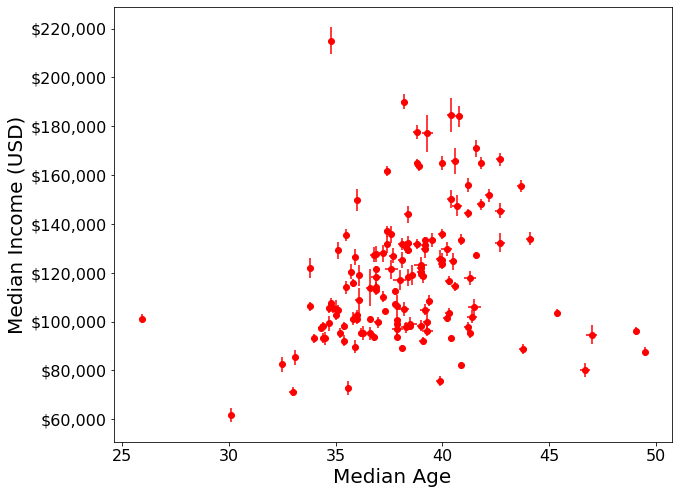

In [10]:
plt.figure(figsize=(10, 8))
plt.errorbar(state["Estimate!!SEX AND AGE!!Total population!!Median age (years)"],Penn["S0201_229E"], xerr=state["Margin of Error!!SEX AND AGE!!Total population!!Median age (years)"]/1.645, yerr = Penn["S0201_229M"]/1.645,fmt="o", color="r")
plt.xlabel("Median Age",fontsize=20)
plt.ylabel("Median Income (USD)",fontsize=20)
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['${:,.0f}'.format(x) for x in current_values])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

In [149]:
from scipy import stats
x=state["Estimate!!SEX AND AGE!!Total population!!Median age (years)"]
y=Penn["S0201_229E"]
slope, intercept, r, p, std_err = stats.linregress(x,y)
def myfunc(x):
  return slope * x + intercept
mymodel = list(map(myfunc, x))

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_17090/1129046598.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['${:,.0f}'.format(x) for x in current_values])


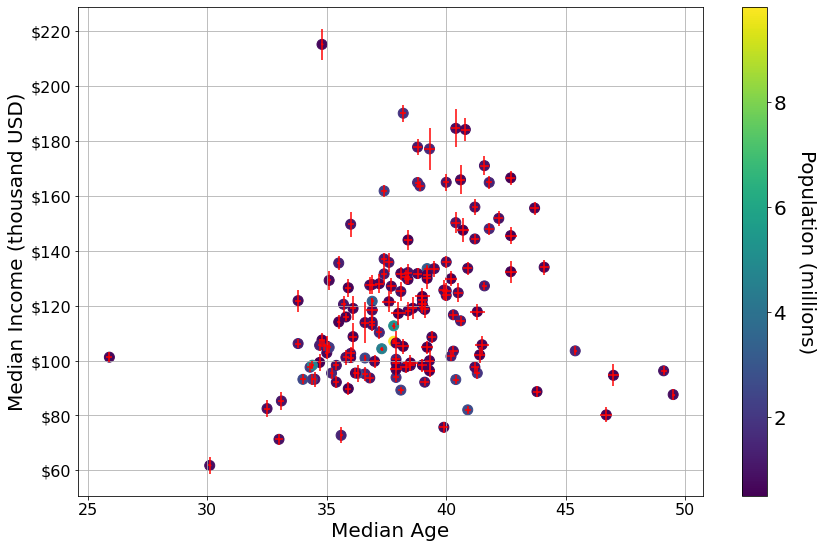

In [11]:
plt.figure(figsize=(14, 9))
plt.errorbar(state["Estimate!!SEX AND AGE!!Total population!!Median age (years)"],Penn["S0201_229E"]/1000, xerr=state["Margin of Error!!SEX AND AGE!!Total population!!Median age (years)"]/1.645, yerr = Penn["S0201_229M"]/1645,ms=1,fmt="o", color="r")
plt.scatter(state["Estimate!!SEX AND AGE!!Total population!!Median age (years)"],Penn["S0201_229E"]/1000, c=state["Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population"]/1000000, s=100,alpha=1)
plt.xlabel("Median Age",fontsize=20)
plt.ylabel("Median Income (thousand USD)",fontsize=20)
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['${:,.0f}'.format(x) for x in current_values])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
clb = plt.colorbar()
clb.ax.set_ylabel('Population (millions)', rotation=270, fontsize=20,labelpad=30)
for t in clb.ax.get_yticklabels():
     t.set_fontsize(20)
plt.grid()

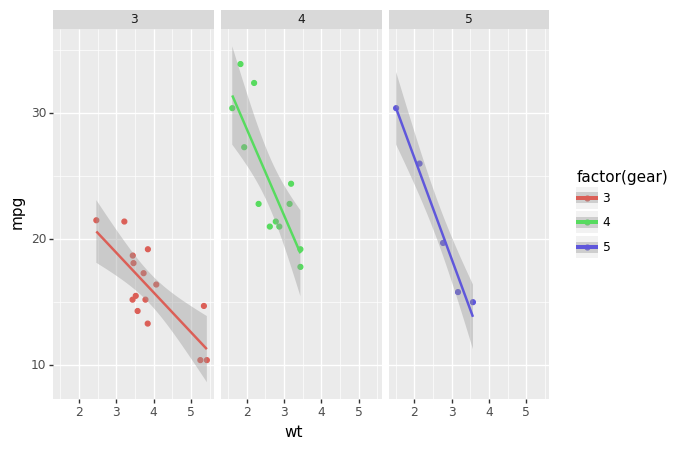

<ggplot: (8782873961988)>

In [20]:
from plotnine import ggplot, geom_point, aes, stat_smooth, facet_wrap
from plotnine.data import mtcars
import plotnine as p9

(ggplot(mtcars, aes('wt', 'mpg', color='factor(gear)'))
 + geom_point()
 + stat_smooth(method='lm')
 + facet_wrap('~gear'))

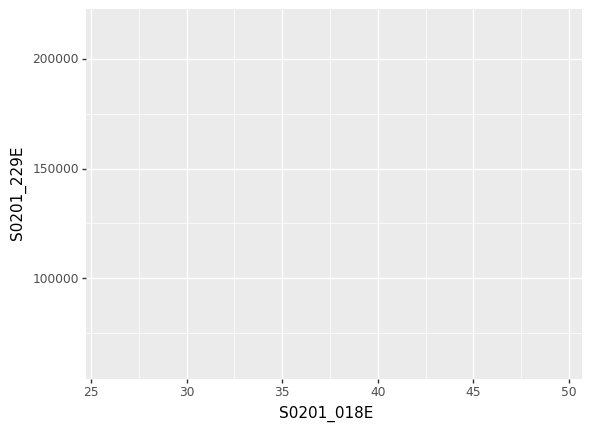

<ggplot: (8782873055847)>

In [21]:
(p9.ggplot(data=Penn,
           mapping=p9.aes(x="S0201_018E", y="S0201_229E")))

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/plotnine/stats/smoothers.py:321: PlotnineWarning: Confidence intervals are not yet implemented for lowess smoothings.


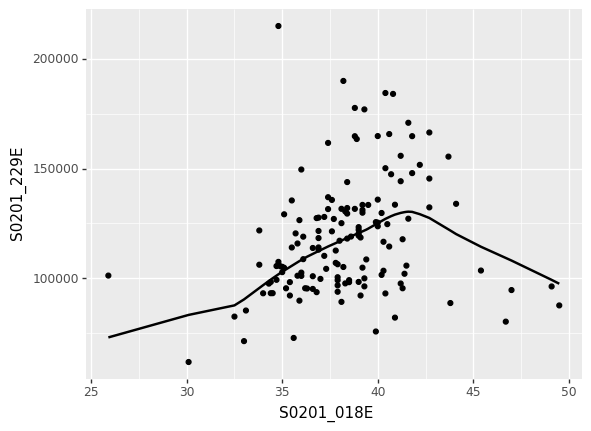

<ggplot: (8782874156891)>

In [27]:
import pandas as pd
import numpy as np

from plotnine import *
from plotnine.data import *

%matplotlib inline

from plotnine import ggplot, aes, geom_line
(
ggplot(Penn)  # What data to use
+ aes(x="S0201_018E", y="S0201_229E")  # What variable to use
+ geom_point()  # Geometric object to use for drawing
+ geom_smooth())

In [47]:
pip install --upgrade tsmoothie

Note: you may need to restart the kernel to use updated packages.


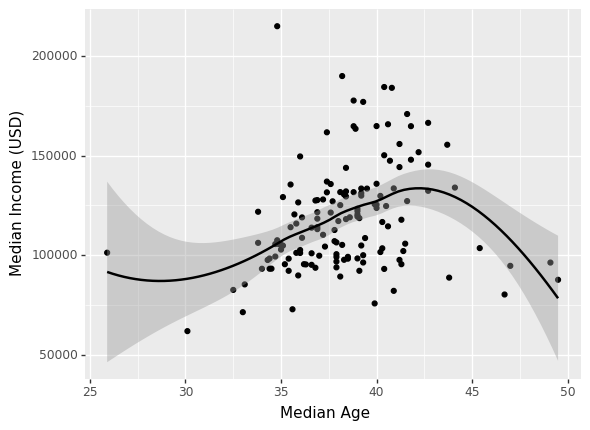

<ggplot: (8782875363060)>

In [50]:

(
    ggplot(Penn, aes(x="S0201_018E", y="S0201_229E"))
    + geom_point()
    + geom_smooth(se=True)
    + labs(x='Median Age', y='Median Income (USD)')
)

In [71]:
plot=   ( ggplot(Penn, aes(x="S0201_018E", y="S0201_229E"))
    + geom_point()
    + geom_smooth(se=True)
    + labs(x='Median Age', y='Median Income (USD)')
    + scale_y_continuous(limits = (50000,200000), breaks = (50000,100000,150000,200000), labels = ["$50,000","$100,000","$150,000","$200,000"])
    + geom_errorbar(Penn,aes(x="S0201_018M", ymin="S0201_229E"-"S0201_229M",ymax="S0201_229E"+"S0201_229M")))
plot

TypeError: unsupported operand type(s) for -: 'str' and 'str'

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_errorbar : Removed 1 rows containing missing values.
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_errorbarh : Removed 1 rows containing missing values.
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 1 rows containing missing values.


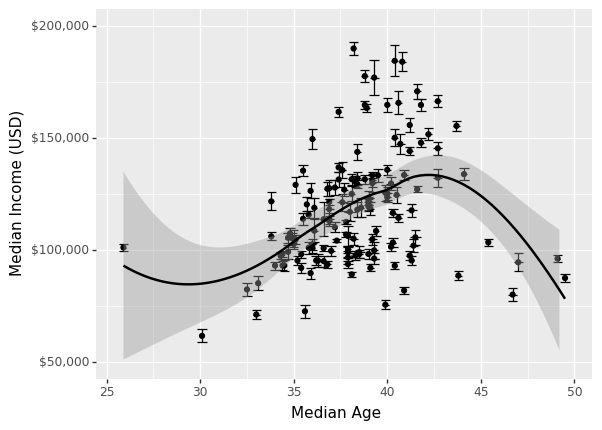

<ggplot: (8782876406592)>

In [92]:
ggplot(Penn, aes(x="S0201_018E", y="S0201_229E"))+geom_errorbar(aes(ymin=Penn["S0201_229E"]-Penn["S0201_229M"]/1.645,ymax=Penn["S0201_229E"]+Penn["S0201_229M"]/1.645))+geom_errorbarh(aes(xmin=Penn["S0201_018E"]-Penn["S0201_018M"]/1.645,xmax=Penn["S0201_018E"]+Penn["S0201_018M"]/1.645))+geom_point()+ geom_smooth(se=True)+ labs(x='Median Age', y='Median Income (USD)') + scale_y_continuous(limits = (50000,200000), breaks = (50000,100000,150000,200000), labels = ["$50,000","$100,000","$150,000","$200,000"])

In [76]:
!pip install scikit-misc

In [41]:
from statsmodels.nonparametric.smoothers_lowess import lowess as  lowess

In [31]:
log = []
for i in state["Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population"]:
    a = math.log10(i)
    log.append(a)

In [32]:
log

[5.824659421246614,
 6.652883097146884,
 6.022028124464763,
 6.217103704332013,
 6.064986682896433,
 6.005858460919884,
 5.962687953973589,
 6.992533371049099,
 6.500758988338322,
 6.390651663960567,
 6.201102304937416,
 6.341377142473202,
 6.516676678394428,
 5.9112647037439725,
 5.897302623601568,
 5.86799044763163,
 6.275428379408563,
 5.6865352795861766,
 5.742724345961345,
 5.9241675959771944,
 5.717786964832727,
 5.816174990428801,
 5.852152319299209,
 5.867978087606938,
 5.763114139859165,
 5.98216626585573,
 5.952721749448629,
 5.9363629195977445,
 5.757174269407812,
 5.826107211527519,
 5.790023241391789,
 6.285778450351796,
 5.999971769941189,
 6.169731435141693,
 5.896512990045017,
 6.425334797034243,
 6.153127373278521,
 6.17550804443637,
 5.766462669135142,
 5.980737186452477,
 5.877094783889358,
 5.75159623874351,
 5.884683236949675,
 5.879507604271761,
 6.027485787695975,
 5.984322944338418,
 6.000386350188551,
 5.70921142906441,
 6.71375473553253,
 5.96608773601439,
 5.

In [128]:
state["Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population"]

0       667820
1      4496588
2      1052030
3      1648556
4      1161413
        ...   
139     925708
140     833540
141     546040
142     563951
143     928059
Name: Estimate!!TOTAL NUMBER OF RACES REPORTED!!Total population, Length: 144, dtype: int64

In [77]:
rock = pd.read_csv("cneos_fireball_data.csv")
rock

,Peak Brightness Date/Time (UT),Latitude (deg.),Longitude (deg.),Altitude (km),Velocity (km/s),vx,vy,vz,Total Radiated Energy (J),Calculated Total Impact Energy (kt)
0,2022-09-15 02:49:02,22.7N,97.6E,31.5,NaN,NaN,NaN,NaN,2.700000e+10,0.095
1,2022-09-14 23:31:15,40.8N,63.4E,35.8,17.4,-13.9,-4.3,9.5,3.200000e+10,0.110
2,2022-09-04 03:54:55,20.0N,165.9E,14.0,21.9,18.4,-11.4,-3.5,2.400000e+10,0.086
3,2022-08-21 16:35:49,6.3S,51.5E,37.0,NaN,NaN,NaN,NaN,2.100000e+10,0.076
4,2022-08-14 07:39:18,35.0S,78.4E,55.5,NaN,NaN,NaN,NaN,4.680000e+11,1.200
...,...,...,...,...,...,...,...,...,...,...
927,1993-11-29 17:48:41,26.5N,78.3E,NaN,NaN,NaN,NaN,NaN,2.600000e+10,0.092
928,1993-10-31 03:39:27,51.3N,100.9W,NaN,NaN,NaN,NaN,NaN,4.000000e+10,0.130
929,1991-10-04 09:22:47,78.7N,6.3E,NaN,NaN,NaN,NaN,NaN,5.500000e+11,1.400
930,1990-10-01 03:51:47,7.5N,142.8E,NaN,NaN,NaN,NaN,NaN,2.500000e+12,5.200


In [78]:
def clean(x):
    love = []
    for i in x:
        if (pd.isnull(i) == False):
            love.append(i)
    return(love)

In [89]:
long = rock["Longitude (deg.)"]
lat = rock["Latitude (deg.)"]

In [90]:
q = clean(long)
r = clean(lat)

In [92]:
gaia = []
for i in x:
    if i[1] == "E":
        a = float(i[0])
        gaia.append(a*1)
    elif i[1] == "W":
        b = float(i[0])
        gaia.append(b*-1)

In [93]:
agul = []
for i in y:
    if i[1] == "N":
        a = float(i[0])
        agul.append(a*1)
    elif i[1] == "S":
        b = float(i[0])
        agul.append(b*-1)

In [83]:
def splog(string):
    mag=string[:-1]
    direction = string[-1]
    return(mag, direction)

In [91]:
x = []
for i in q:
    x.append(splog(i))
    
y = []
for i in r:
    y.append(splog(i))

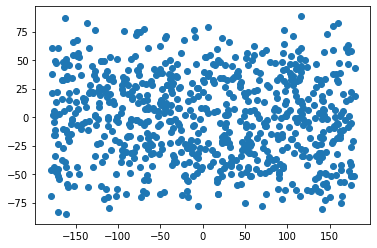

In [94]:
plt.scatter(gaia,agul)

In [60]:
jack = clean(rock["Velocity (km/s)"])
jack

[17.4,
 21.9,
 29.9,
 19.8,
 15.2,
 17.4,
 16.0,
 20.2,
 20.1,
 24.9,
 12.7,
 20.6,
 19.7,
 19.6,
 18.2,
 17.2,
 21.5,
 13.1,
 22.8,
 20.0,
 22.8,
 22.0,
 18.2,
 19.7,
 23.0,
 15.9,
 27.5,
 21.2,
 13.6,
 14.7,
 15.7,
 26.6,
 14.1,
 14.1,
 18.1,
 23.3,
 13.1,
 12.8,
 15.2,
 14.3,
 19.2,
 14.4,
 15.2,
 13.6,
 19.6,
 16.7,
 17.6,
 17.6,
 16.4,
 11.7,
 23.4,
 11.1,
 14.1,
 18.3,
 14.9,
 14.5,
 20.7,
 19.8,
 21.5,
 31.7,
 19.8,
 21.2,
 27.4,
 15.5,
 12.9,
 22.2,
 17.8,
 13.0,
 24.7,
 27.4,
 14.1,
 20.4,
 15.9,
 13.5,
 18.5,
 17.2,
 13.4,
 14.9,
 16.1,
 42.3,
 14.9,
 17.5,
 15.8,
 11.5,
 15.2,
 11.4,
 15.9,
 18.1,
 16.2,
 14.4,
 20.8,
 16.3,
 11.6,
 16.5,
 13.6,
 17.4,
 19.1,
 14.7,
 16.5,
 12.5,
 11.1,
 16.1,
 24.4,
 14.1,
 14.4,
 16.9,
 11.5,
 13.1,
 14.6,
 20.9,
 10.9,
 13.1,
 16.5,
 23.7,
 21.0,
 31.4,
 11.4,
 16.7,
 15.9,
 14.6,
 14.7,
 17.2,
 13.7,
 15.2,
 24.3,
 13.6,
 18.4,
 21.5,
 36.5,
 12.2,
 24.2,
 29.7,
 17.4,
 14.2,
 17.5,
 18.3,
 14.9,
 25.1,
 29.1,
 14.5,
 20.8,
 12.2,
 17.1,

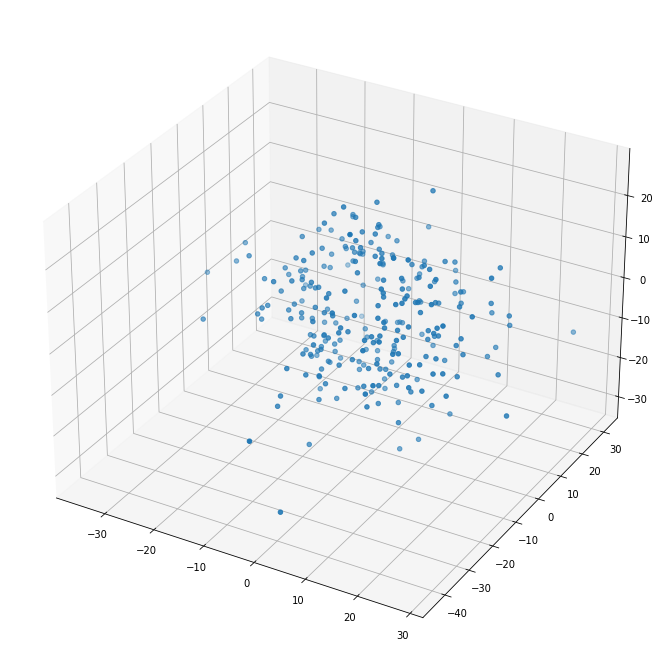

In [64]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(projection='3d')
ax.scatter(rock.vx, rock.vy,rock.vz)

(array([ 63., 100.,  66.,  28.,   9.,   7.,   2.,   0.,   2.,   1.]),
 array([ 9.8 , 13.72, 17.64, 21.56, 25.48, 29.4 , 33.32, 37.24, 41.16,
        45.08, 49.  ]),
 <BarContainer object of 10 artists>)

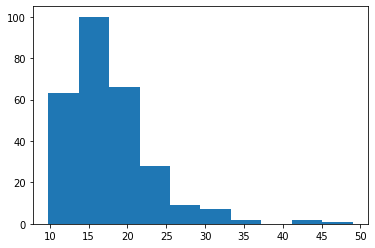

In [65]:
plt.hist(rock["Velocity (km/s)"])

Text(0, 0.5, 'Calculated Total Impact Energy')

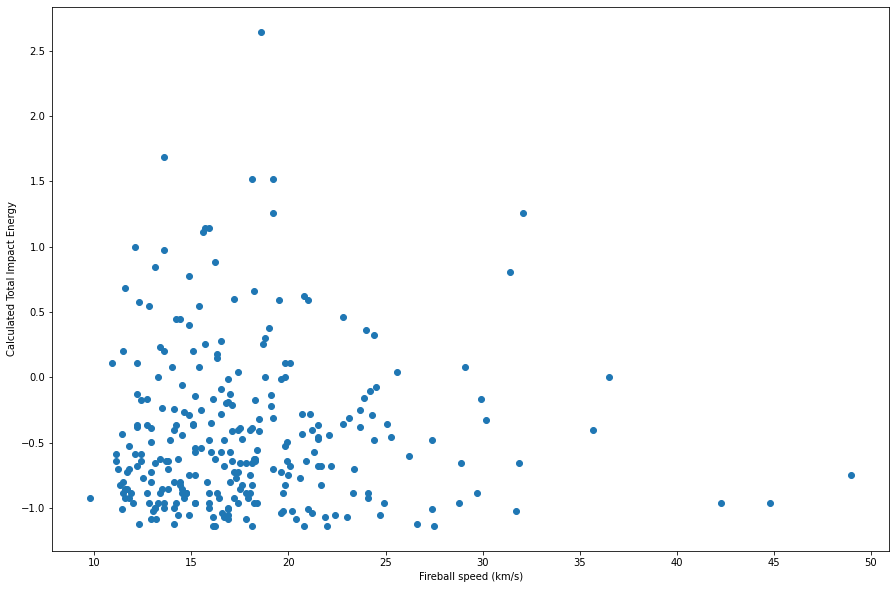

In [80]:
plt.figure(1, figsize = (15,10))
plt.scatter(rock["Velocity (km/s)"], logs)
plt.xlabel("Fireball speed (km/s)")
plt.ylabel("Calculated Total Impact Energy")

In [78]:
import math

logs = []
for i in rock["Calculated Total Impact Energy (kt)"]:
    logs.append(math.log10(i))

In [58]:
rick = rock.dropna()

In [59]:
rick

,Peak Brightness Date/Time (UT),Latitude (deg.),Longitude (deg.),Altitude (km),Velocity (km/s),vx,vy,vz,Total Radiated Energy (J),Calculated Total Impact Energy (kt)
1,2022-09-14 23:31:15,40.8N,63.4E,35.8,17.4,-13.9,-4.3,9.5,3.200000e+10,0.110
2,2022-09-04 03:54:55,20.0N,165.9E,14.0,21.9,18.4,-11.4,-3.5,2.400000e+10,0.086
5,2022-07-28 01:36:08,6.0S,86.9W,37.5,29.9,-17.1,23.5,-7.2,2.510000e+11,0.680
6,2022-07-27 04:41:30,44.8S,2.9W,38.1,19.8,-6.1,17.7,6.5,5.240000e+11,1.300
7,2022-07-25 07:28:17,40.5S,76.6E,33.6,15.2,-2.1,-2.2,14.9,8.700000e+10,0.270
...,...,...,...,...,...,...,...,...,...,...
661,2004-04-22 04:21:49,44.3S,83.3E,29.6,16.3,8.5,-12.1,-6.8,6.240000e+11,1.500
662,2004-04-06 03:24:49,12.0S,162.8E,35.0,25.6,10.5,-23.2,-2.9,4.330000e+11,1.100
673,2003-11-10 13:54:06,64.5S,136.2E,23.0,20.1,14.8,-8.7,10.4,5.180000e+11,1.300
678,2003-09-27 12:59:02,21.0N,86.6E,26.0,18.2,-1.0,-5.4,-17.3,2.150000e+12,4.600


(array([ 5., 10., 15., 20., 25., 30., 35., 40., 45., 50.]),
 [Text(5.0, 0, '5'),
  Text(10.0, 0, '10'),
  Text(15.0, 0, '15'),
  Text(20.0, 0, '20'),
  Text(25.0, 0, '25'),
  Text(30.0, 0, '30'),
  Text(35.0, 0, '35'),
  Text(40.0, 0, '40'),
  Text(45.0, 0, '45'),
  Text(50.0, 0, '50')])

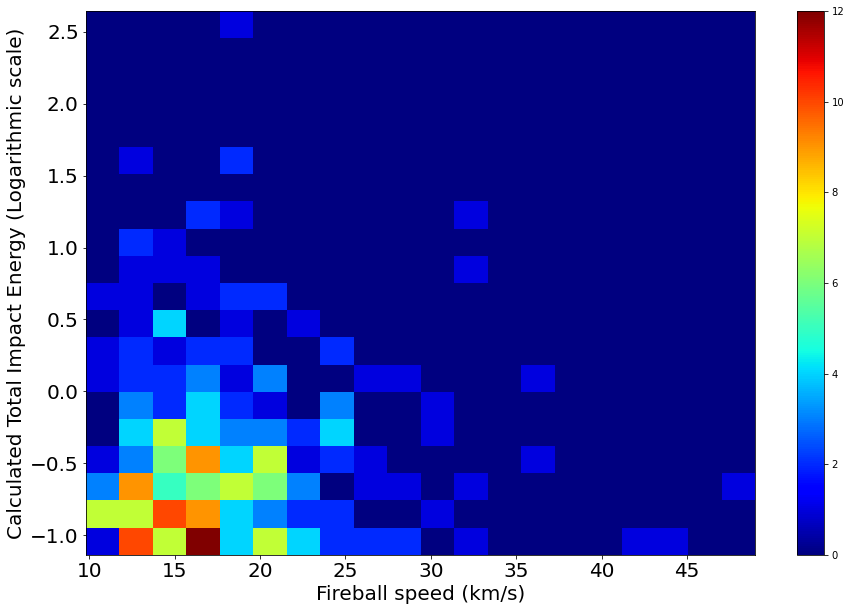

In [67]:
plt.figure(1, figsize = (15,10))
plt.hist2d(rick["Velocity (km/s)"], pogs, bins=(20, 20), cmap=plt.cm.jet)
plt.colorbar()
plt.xlabel("Fireball speed (km/s)", fontsize=20)
plt.ylabel("Calculated Total Impact Energy (Logarithmic scale)", fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

In [61]:
import math

pogs = []
for i in rick["Calculated Total Impact Energy (kt)"]:
    pogs.append(math.log10(i))

In [ ]:
plt.figure(1, figsize = (15,10))
plt.hist2d(rick["Velocity (km/s)"], pogs, bins=(14, 14), cmap=plt.cm.jet)
plt.colorbar()
plt.xlabel("Fireball speed (km/s)")
plt.ylabel("Calculated Total Impact Energy")

In [68]:
year=[]
for i in rick["Peak Brightness Date/Time (UT)"]:
    a=i.split("-")[0]
    year.append(a)
rick["year"] = year

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_8774/2314806997.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [98]:
rick

,Peak Brightness Date/Time (UT),Latitude (deg.),Longitude (deg.),Altitude (km),Velocity (km/s),vx,vy,vz,Total Radiated Energy (J),Calculated Total Impact Energy (kt),year
1,2022-09-14 23:31:15,40.8N,63.4E,35.8,17.4,-13.9,-4.3,9.5,3.200000e+10,0.110,2022
2,2022-09-04 03:54:55,20.0N,165.9E,14.0,21.9,18.4,-11.4,-3.5,2.400000e+10,0.086,2022
5,2022-07-28 01:36:08,6.0S,86.9W,37.5,29.9,-17.1,23.5,-7.2,2.510000e+11,0.680,2022
6,2022-07-27 04:41:30,44.8S,2.9W,38.1,19.8,-6.1,17.7,6.5,5.240000e+11,1.300,2022
7,2022-07-25 07:28:17,40.5S,76.6E,33.6,15.2,-2.1,-2.2,14.9,8.700000e+10,0.270,2022
...,...,...,...,...,...,...,...,...,...,...,...
661,2004-04-22 04:21:49,44.3S,83.3E,29.6,16.3,8.5,-12.1,-6.8,6.240000e+11,1.500,2004
662,2004-04-06 03:24:49,12.0S,162.8E,35.0,25.6,10.5,-23.2,-2.9,4.330000e+11,1.100,2004
673,2003-11-10 13:54:06,64.5S,136.2E,23.0,20.1,14.8,-8.7,10.4,5.180000e+11,1.300,2003
678,2003-09-27 12:59:02,21.0N,86.6E,26.0,18.2,-1.0,-5.4,-17.3,2.150000e+12,4.600,2003


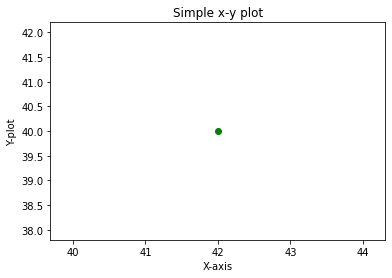

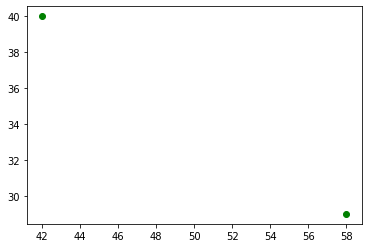

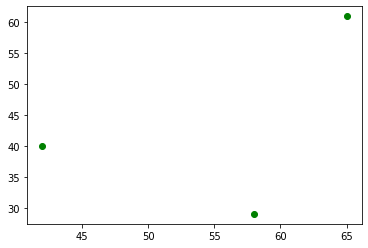

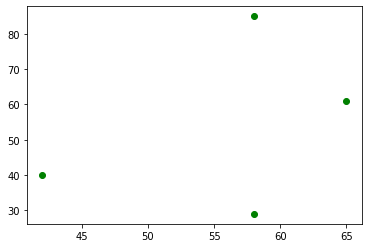

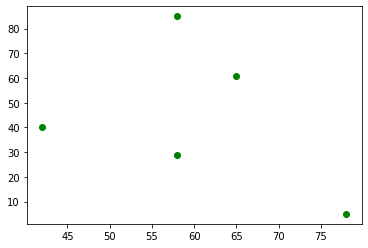

...

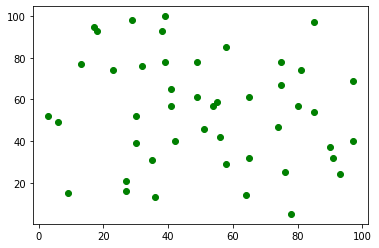

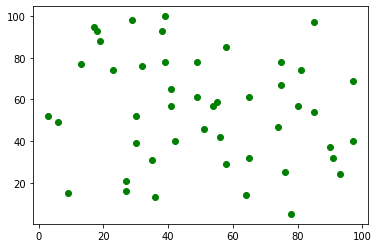

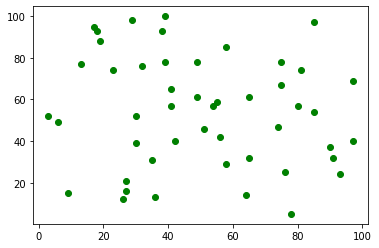

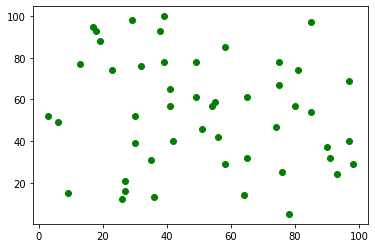

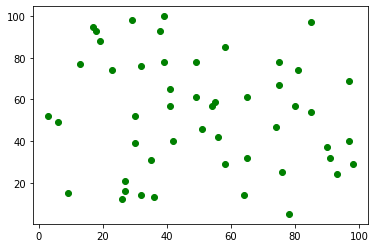

SystemExit: 

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3452: UserWarning:

To exit: use 'exit', 'quit', or Ctrl-D.



In [70]:
from matplotlib import pyplot as plt
import random
import sys
 
x = gaia
y = []
 
plt.xlabel("X-axis")
plt.ylabel("Y-plot")
plt.title("Simple x-y plot")
for i in range(0, 50):
    x.append(random.randint(0, 100))
    y.append(random.randint(0, 100))
    plt.scatter(x, y, color = "green")
    plt.pause(0.01)
     
sys.exit(plt.show())

In [72]:
rick

,Peak Brightness Date/Time (UT),Latitude (deg.),Longitude (deg.),Altitude (km),Velocity (km/s),vx,vy,vz,Total Radiated Energy (J),Calculated Total Impact Energy (kt),year
1,2022-09-14 23:31:15,40.8N,63.4E,35.8,17.4,-13.9,-4.3,9.5,3.200000e+10,0.110,2022
2,2022-09-04 03:54:55,20.0N,165.9E,14.0,21.9,18.4,-11.4,-3.5,2.400000e+10,0.086,2022
5,2022-07-28 01:36:08,6.0S,86.9W,37.5,29.9,-17.1,23.5,-7.2,2.510000e+11,0.680,2022
6,2022-07-27 04:41:30,44.8S,2.9W,38.1,19.8,-6.1,17.7,6.5,5.240000e+11,1.300,2022
7,2022-07-25 07:28:17,40.5S,76.6E,33.6,15.2,-2.1,-2.2,14.9,8.700000e+10,0.270,2022
...,...,...,...,...,...,...,...,...,...,...,...
661,2004-04-22 04:21:49,44.3S,83.3E,29.6,16.3,8.5,-12.1,-6.8,6.240000e+11,1.500,2004
662,2004-04-06 03:24:49,12.0S,162.8E,35.0,25.6,10.5,-23.2,-2.9,4.330000e+11,1.100,2004
673,2003-11-10 13:54:06,64.5S,136.2E,23.0,20.1,14.8,-8.7,10.4,5.180000e+11,1.300,2003
678,2003-09-27 12:59:02,21.0N,86.6E,26.0,18.2,-1.0,-5.4,-17.3,2.150000e+12,4.600,2003


In [4]:
from ipywidgets import widgets

In [3]:
bg

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
1,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,1,4,1,1,2,1,5,23,40
2,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,0,1,0,1,2,9,10
3,Albania,Europe,c,2022,PF,3,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
4,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,2,6,2,2,2,1,7,22,32
5,Andorra,Europe,c,2022,F,1,1,4,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091,West Bank,Middle East,t,2013,NF,6,5,0,0,2,...,0,1,5,1,1,2,1,5,24,30
2092,Western Sahara,Africa,t,2013,NF,7,7,0,0,0,...,0,0,0,1,1,2,0,4,7,5
2093,Yemen,Middle East,c,2013,NF,6,6,1,0,2,...,0,1,2,2,1,1,1,5,16,25
2094,Zambia,Africa,c,2013,PF,3,4,3,3,3,...,2,2,8,3,2,1,2,8,34,62


In [ ]:
year = widgets.IntSlider(
    value=2013,
    min=2013,
    max=2022,
    step=1,
    description='Edition',
    continuous_update=False
)

use_date = widgets.Checkbox(
    description='Date: ',
    value=True,
)

container = widgets.HBox(children=[use_date, year])

In [15]:
def year(i):
    year = bg.loc[bg.Edition == i].reset_index()
    return(year)

In [23]:
def plot(df):
    title = "Percent change in Civil Liberty Score from 2020 to 2022"
    fig = px.choropleth(year, locations='Country/Territory',locationmode='country names', color='Total',scope="world",labels={'Total':'CL score'}
                   ,color_continuous_scale=[
                        [0, 'rgb(239,0,0)'],[0.3, 'rgb(255,140,7)'],[0.6, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']])
    fig.update_layout(title={'text' : title,'x':0.5,'xanchor': 'center'},coloraxis_colorbar_orientation='h',coloraxis_colorbar_y=-0.2)
    return(fig)

In [13]:
bg

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
1,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,1,4,1,1,2,1,5,23,40
2,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,0,1,0,1,2,9,10
3,Albania,Europe,c,2022,PF,3,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
4,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,2,6,2,2,2,1,7,22,32
5,Andorra,Europe,c,2022,F,1,1,4,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091,West Bank,Middle East,t,2013,NF,6,5,0,0,2,...,0,1,5,1,1,2,1,5,24,30
2092,Western Sahara,Africa,t,2013,NF,7,7,0,0,0,...,0,0,0,1,1,2,0,4,7,5
2093,Yemen,Middle East,c,2013,NF,6,6,1,0,2,...,0,1,2,2,1,1,1,5,16,25
2094,Zambia,Africa,c,2013,PF,3,4,3,3,3,...,2,2,8,3,2,1,2,8,34,62


In [24]:
a = year(2013)

In [101]:
def choro(i):
    a = str(i)
    title = ("CL score by country in " + a)
    df = bg.loc[bg.Edition == i]
    df["total"] = df["Total"].astype(float)
    fig = px.choropleth(df, locations='Country/Territory',locationmode='country names', color='total',scope="world",labels={'total':'CL score'}
                   ,hover_name="Country/Territory",color_continuous_scale=[
                        [0, 'rgb(239,0,0)'],[1/3, 'rgb(255,140,7)'],[2/3, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']])
    fig.update_layout(title={
            'text' : title,
            'x':0.5,
            'xanchor': 'center'
        },
            coloraxis_colorbar_orientation='h',coloraxis_colorbar_y=-0.2)
    return(fig)

In [102]:
choro(2022)

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_11328/2389995615.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [135]:
# let's create the steps for the slider
steps = []
for i in range(len(data)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data)],
                label='Year {}'.format(i + 2013))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0,
                pad={"t": 1},
                steps=steps)]    
layout = dict(geo=dict(scope='world',
                       ),
              sliders=sliders)

In [134]:
data = [dict(type='choropleth',
             locations = bg['Country/Territory'].astype(str),
             z=bg['Total'].astype(float),
             locationmode='country names',labels = {'total':'CL score'}
                   ,hover_name = "Country/Territory",color_continuous_scale=[
                        [0, 'rgb(239,0,0)'],[1/3, 'rgb(255,140,7)'],[2/3, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']])]


In [136]:
fig = dict(data=data, 
           layout=layout)
plotly.offline.iplot(fig)

ValueError: Invalid property specified for object of type plotly.graph_objs.Choropleth: 'labels'

Did you mean "name"?

    Valid properties:
        autocolorscale
            Determines whether the colorscale is a default palette
            (`autocolorscale: true`) or the palette determined by
            `colorscale`. In case `colorscale` is unspecified or
            `autocolorscale` is true, the default  palette will be
            chosen according to whether numbers in the `color`
            array are all positive, all negative or mixed.
        coloraxis
            Sets a reference to a shared color axis. References to
            these shared color axes are "coloraxis", "coloraxis2",
            "coloraxis3", etc. Settings for these shared color axes
            are set in the layout, under `layout.coloraxis`,
            `layout.coloraxis2`, etc. Note that multiple color
            scales can be linked to the same color axis.
        colorbar
            :class:`plotly.graph_objects.choropleth.ColorBar`
            instance or dict with compatible properties
        colorscale
            Sets the colorscale. The colorscale must be an array
            containing arrays mapping a normalized value to an rgb,
            rgba, hex, hsl, hsv, or named color string. At minimum,
            a mapping for the lowest (0) and highest (1) values are
            required. For example, `[[0, 'rgb(0,0,255)'], [1,
            'rgb(255,0,0)']]`. To control the bounds of the
            colorscale in color space, use`zmin` and `zmax`.
            Alternatively, `colorscale` may be a palette name
            string of the following list: Blackbody,Bluered,Blues,C
            ividis,Earth,Electric,Greens,Greys,Hot,Jet,Picnic,Portl
            and,Rainbow,RdBu,Reds,Viridis,YlGnBu,YlOrRd.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        featureidkey
            Sets the key in GeoJSON features which is used as id to
            match the items included in the `locations` array. Only
            has an effect when `geojson` is set. Support nested
            property, for example "properties.name".
        geo
            Sets a reference between this trace's geospatial
            coordinates and a geographic map. If "geo" (the default
            value), the geospatial coordinates refer to
            `layout.geo`. If "geo2", the geospatial coordinates
            refer to `layout.geo2`, and so on.
        geojson
            Sets optional GeoJSON data associated with this trace.
            If not given, the features on the base map are used. It
            can be set as a valid GeoJSON object or as a URL
            string. Note that we only accept GeoJSONs of type
            "FeatureCollection" or "Feature" with geometries of
            type "Polygon" or "MultiPolygon".
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.choropleth.Hoverlabel`
            instance or dict with compatible properties
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Same as `text`.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.choropleth.Legendgrouptitl
            e` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with `*reversed* `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items.
        locationmode
            Determines the set of locations used to match entries
            in `locations` to regions on the map. Values "ISO-3",
            "USA-states", *country names* correspond to features on
            the base map and value "geojson-id" corresponds to
            features from a custom GeoJSON linked to the `geojson`
            attribute.
        locations
            Sets the coordinates via location IDs or names. See
            `locationmode` for more info.
        locationssrc
            Sets the source reference on Chart Studio Cloud for
            `locations`.
        marker
            :class:`plotly.graph_objects.choropleth.Marker`
            instance or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        reversescale
            Reverses the color mapping if true. If true, `zmin`
            will correspond to the last color in the array and
            `zmax` will correspond to the first color.
        selected
            :class:`plotly.graph_objects.choropleth.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        showscale
            Determines whether or not a colorbar is displayed for
            this trace.
        stream
            :class:`plotly.graph_objects.choropleth.Stream`
            instance or dict with compatible properties
        text
            Sets the text elements associated with each location.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.choropleth.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        z
            Sets the color values.
        zauto
            Determines whether or not the color domain is computed
            with respect to the input data (here in `z`) or the
            bounds set in `zmin` and `zmax`  Defaults to `false`
            when `zmin` and `zmax` are set by the user.
        zmax
            Sets the upper bound of the color domain. Value should
            have the same units as in `z` and if set, `zmin` must
            be set as well.
        zmid
            Sets the mid-point of the color domain by scaling
            `zmin` and/or `zmax` to be equidistant to this point.
            Value should have the same units as in `z`. Has no
            effect when `zauto` is `false`.
        zmin
            Sets the lower bound of the color domain. Value should
            have the same units as in `z` and if set, `zmax` must
            be set as well.
        zsrc
            Sets the source reference on Chart Studio Cloud for
            `z`.
        
Did you mean "name"?

Bad property path:
labels
^^^^^^

In [98]:
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np

In [129]:
bg

,Country/Territory,Region,C/T,Edition,Status,PR rating,CL rating,A1,A2,A3,...,F3,F4,F,G1,G2,G3,G4,G,CL,Total
1,Abkhazia,Eurasia,t,2022,PF,5,5,2,2,1,...,1,1,4,1,1,2,1,5,23,40
2,Afghanistan,Asia,c,2022,NF,7,6,0,0,0,...,0,0,0,0,1,0,1,2,9,10
3,Albania,Europe,c,2022,PF,3,3,3,3,3,...,2,3,9,3,2,2,2,9,39,67
4,Algeria,Africa,c,2022,NF,6,5,1,1,1,...,2,2,6,2,2,2,1,7,22,32
5,Andorra,Europe,c,2022,F,1,1,4,4,4,...,4,3,15,4,4,3,4,15,55,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091,West Bank,Middle East,t,2013,NF,6,5,0,0,2,...,0,1,5,1,1,2,1,5,24,30
2092,Western Sahara,Africa,t,2013,NF,7,7,0,0,0,...,0,0,0,1,1,2,0,4,7,5
2093,Yemen,Middle East,c,2013,NF,6,6,1,0,2,...,0,1,2,2,1,1,1,5,16,25
2094,Zambia,Africa,c,2013,PF,3,4,3,3,3,...,2,2,8,3,2,1,2,8,34,62


In [6]:
bg["total"] = bg["Total"].astype(float)

In [145]:
px.choropleth(bg,               
              locations="Country/Territory",               
              color="total",
              hover_name="Country/Territory",  
              animation_frame="Edition",    
              color_continuous_scale='Plasma',  
              height=600             
)

In [131]:
plotly.offline.init_notebook_mode()
df = bg

data = [dict(type='choropleth',
             locations = df['Country/Territory'].astype(str),
             z=df['Total'].astype(float),
             locationmode='country names')]

# let's create some additional, random data
for i in range(10):
    data.append(data[0].copy())
    data[-1]['z'] = data[0]['z'] * np.random.rand(*data[0]['z'].shape)

# let's create the steps for the slider
steps = []
for i in range(len(data)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data)],
                label='Year {}'.format(i + 2013))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0,
                pad={"t": 1},
                steps=steps)]    
layout = dict(geo=dict(scope='world'),
              sliders=sliders)

fig = dict(data=data, 
           layout=layout)
plotly.offline.iplot(fig)

In [14]:
greg = px.choropleth(gb, 
              locations="Country/Territory",               
              color="total",
              hover_name="Country/Territory",
              animation_frame="Edition",
              color_continuous_scale=[[0, 'rgb(239,0,0)'],[1/3, 'rgb(255,140,7)'],[2/3, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']],
              locationmode='country names',
              scope="world",
              range_color=(0, 100),
              title='CL by Country/Territory per year',
              height=600
             )
greg

In [18]:
greg.write_html("greg.html")

In [10]:
gb = bg.loc[::-1]

In [30]:
title = "Percent change in Civil Liberty Score from 2020 to 2022"
fig = px.choropleth(trial, locations='Country/Territory',locationmode='country names', color='val',scope="world",labels={'val':'Percent change in CL score (%)'}
                   ,color_continuous_scale=[
                        [0, 'rgb(239,0,0)'],[0.3, 'rgb(255,140,7)'],[0.6, 'rgb(255,255,0)'],[1, 'rgb(0,176,0)']])
fig.update_layout(
            title={
            'text' : title,
            'x':0.5,
            'xanchor': 'center'
        },coloraxis_colorbar_orientation='h',coloraxis_colorbar_y=-0.2)

fig.show()